In [1]:
import PIL as pillow
%matplotlib inline
import numpy as np
import matplotlib.image as mpimg
from scipy import ndimage
from PIL import Image
from PIL import ImageFilter
from matplotlib import pyplot as plt
from matplotlib.pyplot import *
import matplotlib.image as mpimg
import os
import cv2
import time
import scipy.fftpack as fp
#from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:80% !important; }</style>"))

In [2]:
def fft(imagepath):
    ## Functions to go from image to frequency-image and back
    im2freq = lambda data:fp.rfft(fp.rfft(data, axis=0),axis=1)
    freq2im = lambda f:fp.irfft(fp.irfft(f, axis=1),axis=0)


    ## Read in data file and transform
    data = np.array(Image.open(imagepath))
    freq = im2freq(data)
    back = freq2im(freq)
    
    # Make sure the forward and backward transforms work!
    assert(np.allclose(data, back))
    ## Helper functions to rescale a frequency-image to [0, 255] and save
    remmax = lambda x: x/x.max()
    remmin = lambda x: x - np.amin(x, axis=(0,1), keepdims=True)
    touint8 = lambda x: (remmax(remmin(x))*(256-1e-4)).astype(int)
    return(touint8(freq))

In [3]:
def laplacian(path):

    me_non_blur_demosaic = cv2.imread(path)
    blur = cv2.GaussianBlur(me_non_blur_demosaic,(3,3),0,0, cv2.BORDER_DEFAULT)
    laplacian = cv2.Laplacian(blur, ddepth = cv2.CV_16UC3 , ksize = 3, scale = 1,delta = 0, borderType=cv2.BORDER_DEFAULT)
    (mean, stddev) = cv2.meanStdDev(laplacian)
    laplacian_operator_std_dev = stddev[0]
    variance = laplacian_operator_std_dev**2
    return(variance)

In [4]:
# Create image objects
img_blurry_me_DEMOSAIC = ("Sample_Me_Blur/deomosaicimage.bmp")
img_not_blurry_me_DEMOSAIC =("Sample_Me-Non-Blur/deomosaicimage.bmp")
img_blurry_DEMOSAIC = ("SampleBlur/deomosaicimage.bmp")
img_not_blurry_DEMOSAIC =("SampleNon-Blur/deomosaicimage.bmp")
img_blurry_RAW = ("SampleBlur/curFrame.bmp")
img_not_blurry_RAW = ("SampleNon-Blur/curFrame.bmp")
img_blurry_me_RAW = ("Sample_Me_Blur/curFrame.bmp")
img_not_blurry_me_RAW = ("Sample_Me-Non-Blur/curFrame.bmp")


In [5]:
os.remove('saint1.tiff')
os.remove('saint2.tiff')
os.remove('saint3.tiff')
os.remove('saint4.tiff')
os.remove('saint5.tiff')
os.remove('saint6.tiff')
os.remove('saint7.tiff')
os.remove('saint8.tiff')
imsave('saint1.tiff',fft(img_blurry_DEMOSAIC))
imsave('saint2.tiff',fft(img_not_blurry_DEMOSAIC))
imsave('saint3.tiff',fft(img_blurry_RAW))
imsave('saint4.tiff',fft(img_not_blurry_RAW))
imsave('saint5.tiff',fft(img_blurry_me_DEMOSAIC))
imsave('saint6.tiff',fft(img_not_blurry_me_DEMOSAIC))
imsave('saint7.tiff',fft(img_blurry_me_RAW))
imsave('saint8.tiff',fft(img_not_blurry_me_RAW))


In [6]:
# Create image objects
blurry_me_DEMOSAIC = mpimg.imread("Sample_Me_Blur/deomosaicimage.bmp")
not_blurry_me_DEMOSAIC = mpimg.imread("Sample_Me-Non-Blur/deomosaicimage.bmp")
blurry_DEMOSAIC = mpimg.imread("SampleBlur/deomosaicimage.bmp")
not_blurry_DEMOSAIC = mpimg.imread("SampleNon-Blur/deomosaicimage.bmp")
blurry_RAW = mpimg.imread("SampleBlur/curFrame.bmp")
not_blurry_RAW = mpimg.imread("SampleNon-Blur/curFrame.bmp")
blurry_me_RAW = mpimg.imread("Sample_Me_Blur/curFrame.bmp")
not_blurry_me_RAW = mpimg.imread("Sample_Me-Non-Blur/curFrame.bmp")


# Input

Laplacian Variance Difference = 18.6891315508
   ################################################# RAW_test_Image ########################################
     [ 1554.61858963]                                                  [ 1535.92945807]
     0.0226199292323                                                  0.0303075256363


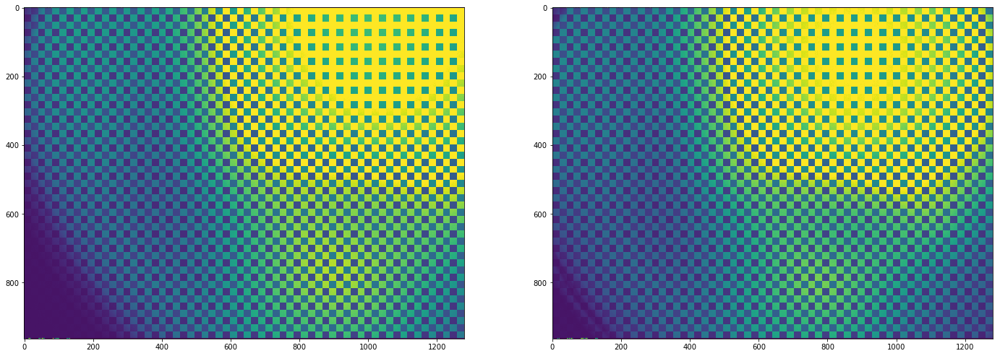

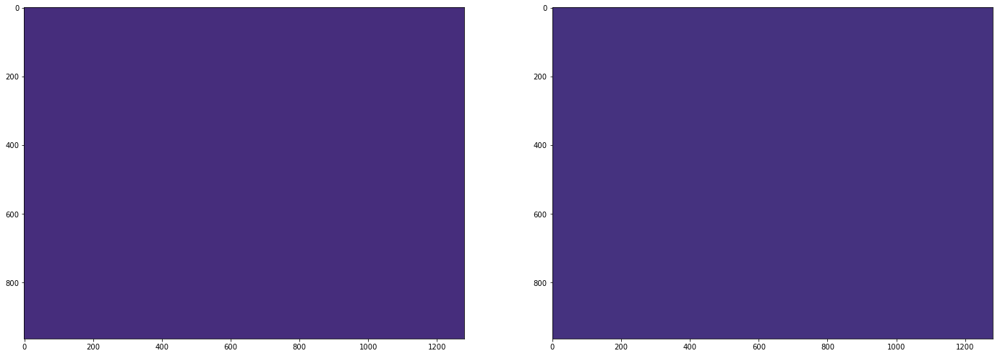

In [7]:
# Display the originals
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(blurry_RAW)
axarr[1].imshow(not_blurry_RAW)
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(imread('saint3.tiff'))
axarr[1].imshow(imread('saint4.tiff'))
print("Laplacian Variance Difference = " + str(abs(float(laplacian(img_blurry_RAW))-float(laplacian(img_not_blurry_RAW)))))
print("   ################################################# RAW_test_Image ########################################")
print("     "+str(laplacian(img_blurry_RAW)) + "                                                  " + str(laplacian(img_not_blurry_RAW)))
print("     "+str(float(laplacian('saint3.tiff'))) + "                                                  " + str(float(laplacian('saint4.tiff'))))

Laplacian Variance Difference = 166.681108005
   ################################################# RAW_Sharp_Image ########################################
     [ 785.84054787]                                                  [ 952.52165588]
     0.0403411050054                                                  0.0404007469095


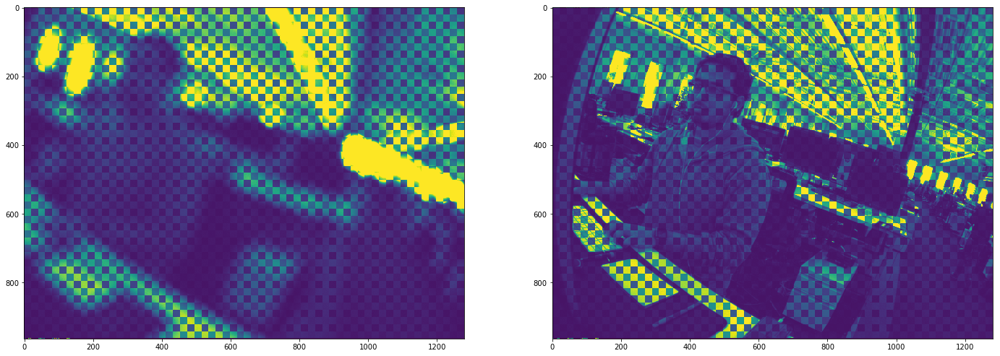

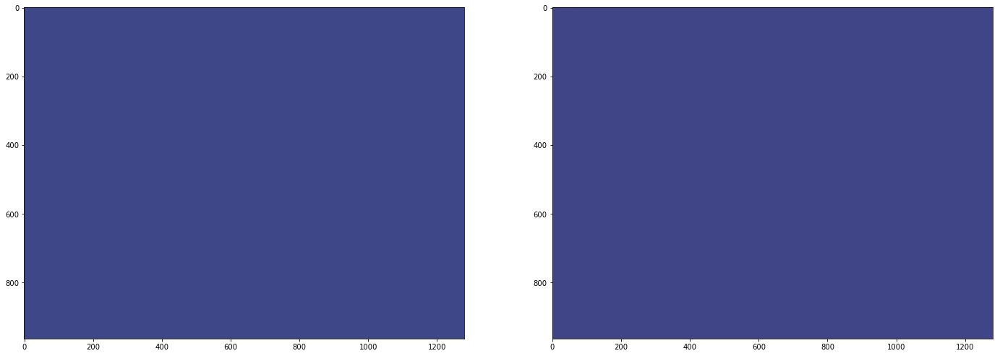

In [8]:
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(blurry_me_RAW)
axarr[1].imshow(not_blurry_me_RAW)
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(imread('saint7.tiff'))
axarr[1].imshow(imread('saint8.tiff'))
print("Laplacian Variance Difference = " + str(abs(float(laplacian(img_blurry_me_RAW))-float(laplacian(img_not_blurry_me_RAW)))))
print("   ################################################# RAW_Sharp_Image ########################################")
print("     "+str(laplacian(img_blurry_me_RAW)) + "                                                  " + str(laplacian(img_not_blurry_me_RAW)))
print("     "+str(float(laplacian('saint7.tiff'))) + "                                                  " + str(float(laplacian('saint8.tiff'))))

Laplacian Variance Difference = 9.54167016088
   ################################################# DEMOSAIC_test_Image ########################################
     [ 114.39990774]                                                  [ 104.85823758]
     0.0218227207999                                                  0.026033458978


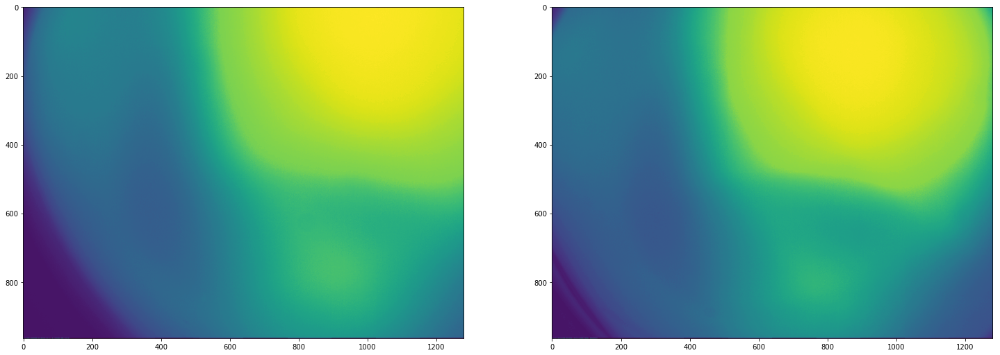

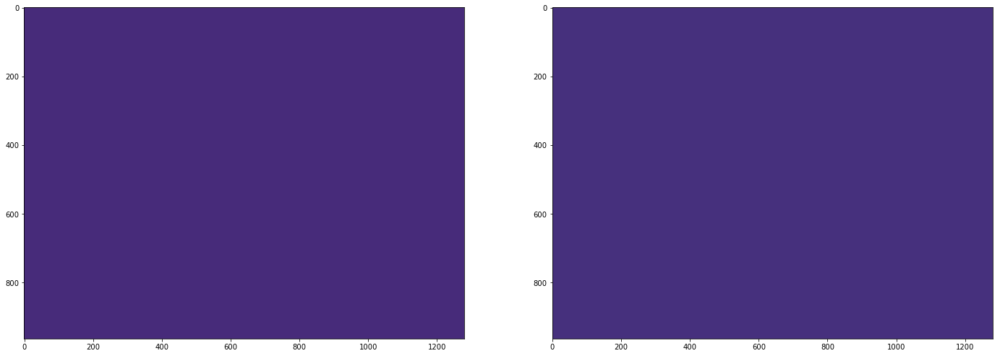

In [9]:
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(blurry_DEMOSAIC)
axarr[1].imshow(not_blurry_DEMOSAIC)
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(imread('saint1.tiff'))
axarr[1].imshow(imread('saint2.tiff'))
print("Laplacian Variance Difference = " + str(abs(float(laplacian(img_blurry_DEMOSAIC))-float(laplacian(img_not_blurry_DEMOSAIC)))))
print("   ################################################# DEMOSAIC_test_Image ########################################")
print("     "+str(laplacian(img_blurry_DEMOSAIC)) + "                                                  " + str(laplacian(img_not_blurry_DEMOSAIC)))
print("     "+str(float(laplacian('saint1.tiff'))) + "                                                  " + str(float(laplacian('saint2.tiff'))))

Laplacian Variance Difference = 148.070435913
   ################################################# DEMOSAIC_Sharp_Image ########################################
     [ 85.40866811]                                                  [ 233.47910403]
     0.0389796929417                                                  0.0365731705202


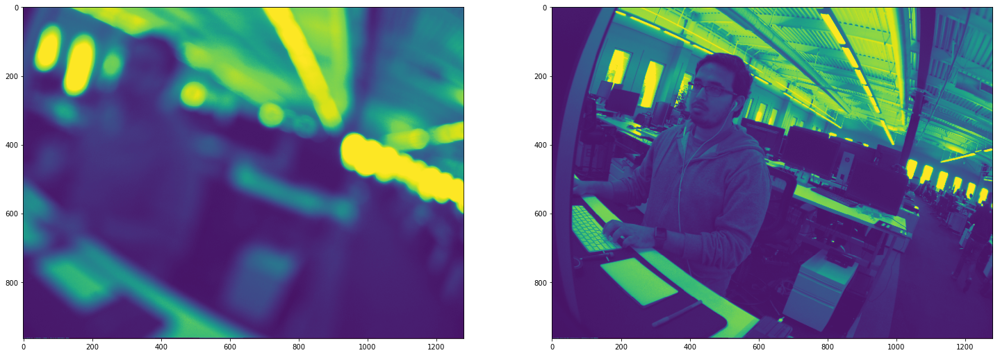

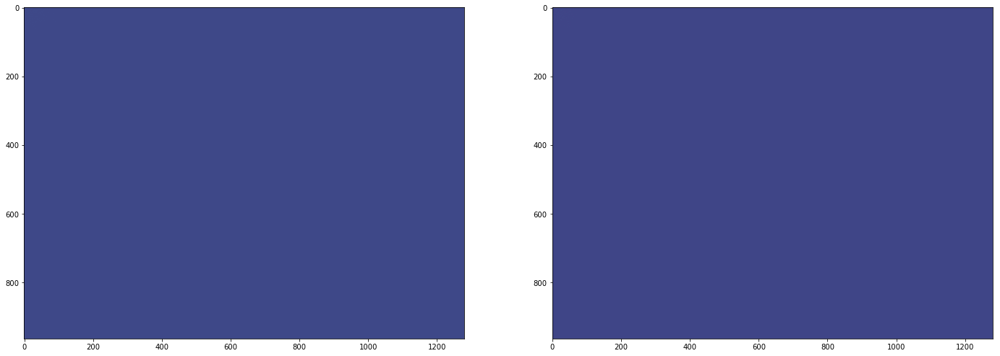

In [10]:
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(blurry_me_DEMOSAIC)
axarr[1].imshow(not_blurry_me_DEMOSAIC)
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(imread('saint5.tiff'))
axarr[1].imshow(imread('saint6.tiff'))
print("Laplacian Variance Difference = " + str(abs(float(laplacian(img_blurry_me_DEMOSAIC))-float(laplacian(img_not_blurry_me_DEMOSAIC)))))
print("   ################################################# DEMOSAIC_Sharp_Image ########################################")
print("     "+str(laplacian(img_blurry_me_DEMOSAIC)) + "                                                  " + str(laplacian(img_not_blurry_me_DEMOSAIC)))
print("     "+str(float(laplacian('saint5.tiff'))) + "                                                  " + str(float(laplacian('saint6.tiff'))))

# Applying Sobel Filter

In [11]:
# Let's find edges

def apply_sobel_filter(input_image):
    im = np.asarray(input_image)
    im = input_image
    sx = ndimage.sobel(im, axis=0, mode='constant')
    sy = ndimage.sobel(im, axis=1, mode='constant')
    mag = np.hypot(sx, sy)  # magnitude
    mag *= 255.0 / np.max(mag)  # normalize (Q&D)
    sob = np.hypot(sx, sy, dtype=np.float32)
    return sob

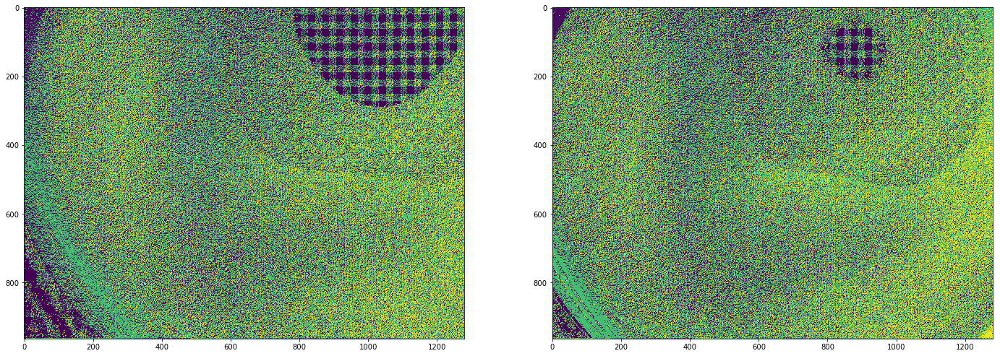

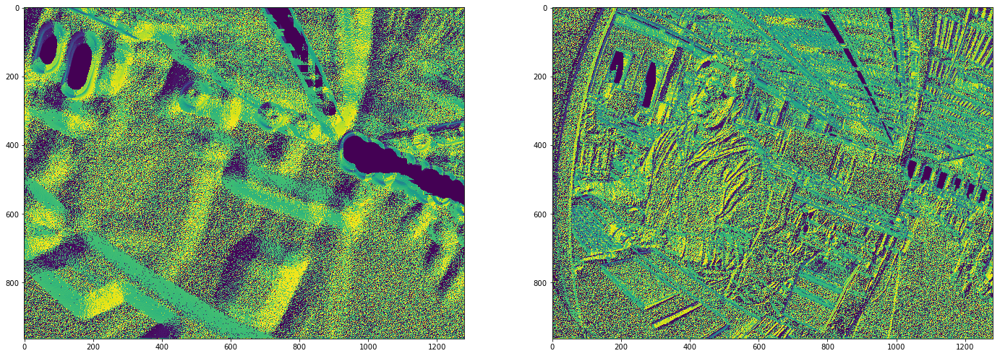

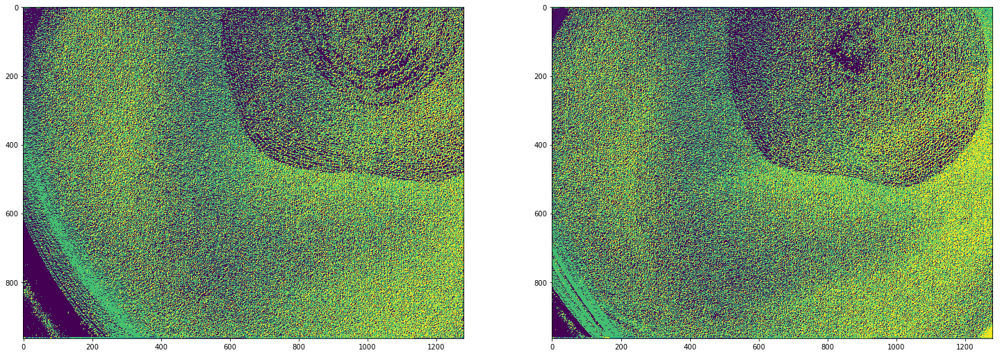

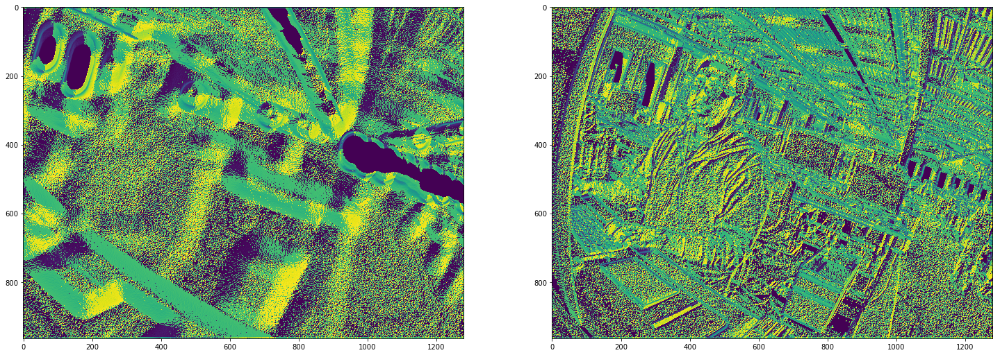

In [12]:
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(apply_sobel_filter(blurry_RAW))
axarr[1].imshow(apply_sobel_filter(not_blurry_RAW))
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(apply_sobel_filter(blurry_me_RAW))
axarr[1].imshow(apply_sobel_filter(not_blurry_me_RAW))
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(apply_sobel_filter(blurry_DEMOSAIC))
axarr[1].imshow(apply_sobel_filter(not_blurry_DEMOSAIC))
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(apply_sobel_filter(blurry_me_DEMOSAIC))
axarr[1].imshow(apply_sobel_filter(not_blurry_me_DEMOSAIC))

In [13]:
    #font                   = cv2.FONT_HERSHEY_SIMPLEX
    #bottomLeftCornerOfText = (10,100)
    #fontScale              = 2
    #fontColor              = (255,0,0)
    #lineType               = 2
    #cv2.putText(me_non_blur_demosaic,str(float(laplacian_operator_std_dev)), bottomLeftCornerOfText, font, fontScale,fontColor,lineType)

    #Display the image
    #f, axarr = plt.subplots(1,2, figsize=(25,20))
    #axarr[0].imshow(mpimg.imread(me_non_blur_demosaic))


In [14]:
#cv2.imshow(apply_sobel_filter(img_blurry_DEMOSAIC))

In [15]:
#Different Sobel fucntions (yield slight=ly a different visual)
def pply_sobel_filter(input_image):
    im = np.asarray(input_image)
    im = input_image
    sx = ndimage.sobel(im, axis=1, mode='constant')
    sy = ndimage.sobel(im, axis=0, mode='constant')
    mag = np.hypot(sx, sy)  # magnitude
    mag *= 255.0 / np.max(mag)  # normalize (Q&D)
    sob = np.hypot(sx, sy, dtype=np.float32)
    imsave('1.tiff',sob)
    return sob


def aapply_sobel_filter(input_image):

    import numpy as np
    from scipy.signal import convolve2d
    from scipy.ndimage import imread

    img = np.asarray(input_image)
    img = input_image
    # Prepare the kernels
    a1 = np.matrix([1, 2, 1])
    a2 = np.matrix([-1, 0, 1])
    Kx = a1.T * a2
    Ky = a2.T * a1

    # Apply the Sobel operator
    Gx = convolve2d(img, Kx, "same", "symm")
    Gy = convolve2d(img, Ky, "same", "symm")
    G = np.sqrt(Gx**2 + Gy**2)
    # or using the absolute values
    #G = np.abs(Gx) + np.abs(Gy)
    return(G)

imsave('saint9.tiff',pply_sobel_filter(blurry_RAW))
imsave('saint10.tiff',pply_sobel_filter(not_blurry_RAW))

imsave('saint11.tiff',aapply_sobel_filter(blurry_RAW))
imsave('saint12.tiff',aapply_sobel_filter(not_blurry_RAW))

imsave('saint13.tiff',pply_sobel_filter(blurry_DEMOSAIC))
imsave('saint14.tiff',pply_sobel_filter(not_blurry_DEMOSAIC))

imsave('saint15.tiff',aapply_sobel_filter(blurry_DEMOSAIC))
imsave('saint16.tiff',aapply_sobel_filter(not_blurry_DEMOSAIC))

imsave('saint17.tiff',pply_sobel_filter(blurry_me_DEMOSAIC))
imsave('saint18.tiff',pply_sobel_filter(not_blurry_me_DEMOSAIC))

imsave('saint19.tiff',aapply_sobel_filter(blurry_me_DEMOSAIC))
imsave('saint20.tiff',aapply_sobel_filter(not_blurry_me_DEMOSAIC))

imsave('saint21.tiff',pply_sobel_filter(blurry_me_RAW))
imsave('saint22.tiff',pply_sobel_filter(not_blurry_me_RAW))

imsave('saint23.tiff',aapply_sobel_filter(blurry_me_RAW))
imsave('saint24.tiff',aapply_sobel_filter(not_blurry_me_RAW))

Laplacian Variance Difference = 0.46011316237
   ################################################# RAW_test_Image ########################################
     17.590936039                                                  18.0510492013


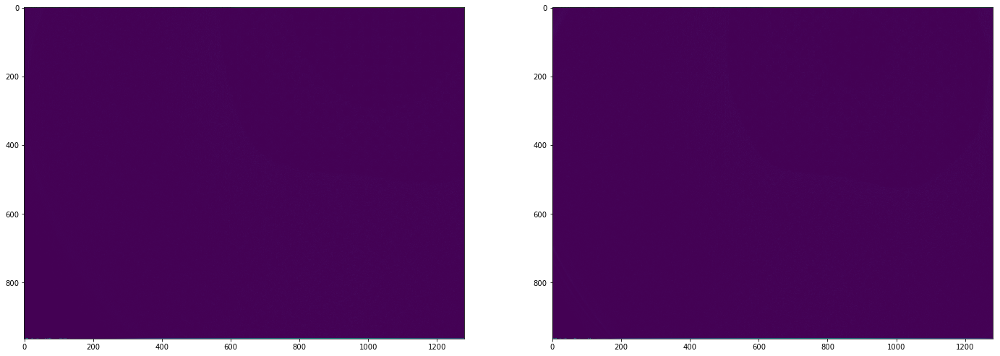

In [16]:
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(aapply_sobel_filter(blurry_RAW))
axarr[1].imshow(aapply_sobel_filter(not_blurry_RAW))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint11.tiff"))-float(laplacian("saint12.tiff")))))
print("   ################################################# RAW_test_Image ########################################")
print("     "+str(float((laplacian("saint11.tiff")))) + "                                                  " + str(float(laplacian("saint12.tiff"))))


Laplacian Variance Difference = 166.981406931
   ################################################# RAW_test_Image ########################################
     1564.99384126                                                  1731.97524819


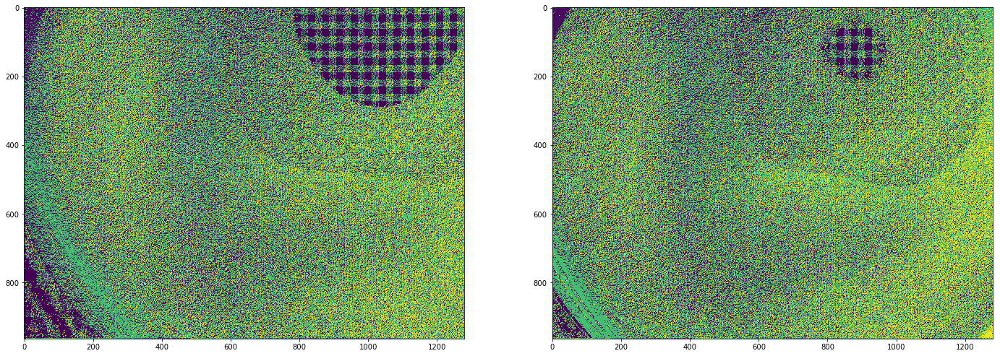

In [17]:
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(pply_sobel_filter(blurry_RAW))
axarr[1].imshow(pply_sobel_filter(not_blurry_RAW))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint9.tiff"))-float(laplacian("saint10.tiff")))))
print("   ################################################# RAW_test_Image ########################################")
print("     "+str(float((laplacian("saint9.tiff")))) + "                                                  " + str(float(laplacian("saint10.tiff"))))


Laplacian Variance Difference = 109.484155976
   ################################################# RAW_Sharp_Image ########################################
     21.5914552654                                                  131.075611241


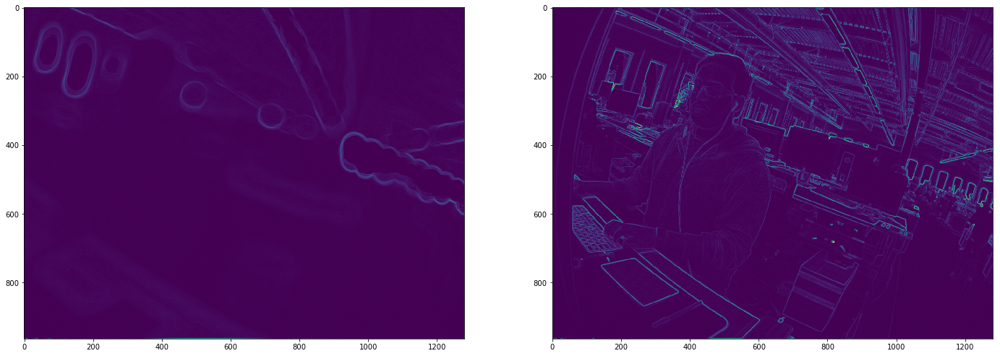

In [18]:
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(aapply_sobel_filter(blurry_me_RAW))
axarr[1].imshow(aapply_sobel_filter(not_blurry_me_RAW))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint23.tiff"))-float(laplacian("saint24.tiff")))))
print("   ################################################# RAW_Sharp_Image ########################################")
print("     "+str(float((laplacian("saint23.tiff")))) + "                                                  " + str(float(laplacian("saint24.tiff"))))


Laplacian Variance Difference = 231.013737412
   ################################################# RAW_Sharp_Image ########################################
     1498.9210148                                                  1729.93475221


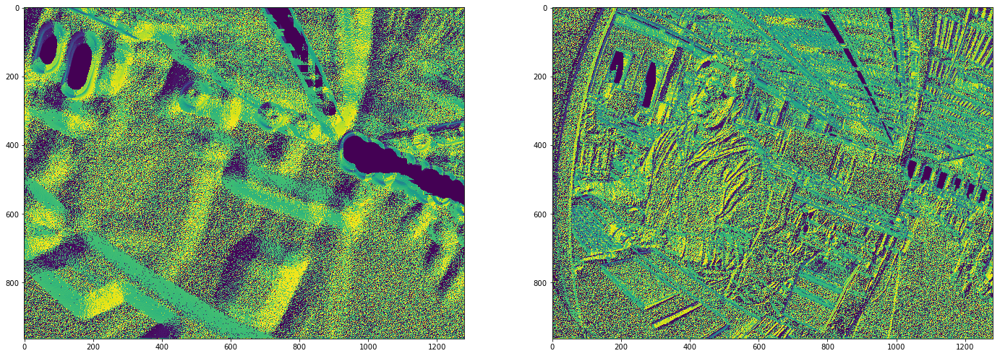

In [19]:
f, axarr = plt.subplots(1,2, figsize=(24,18))
axarr[0].imshow(pply_sobel_filter(blurry_me_RAW))
axarr[1].imshow(pply_sobel_filter(not_blurry_me_RAW))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint21.tiff"))-float(laplacian("saint22.tiff")))))
print("   ################################################# RAW_Sharp_Image ########################################")
print("     "+str(float((laplacian("saint21.tiff")))) + "                                                  " + str(float(laplacian("saint22.tiff"))))


Laplacian Variance Difference = 1.39218239949
   ################################################# DEMOSAIC_test_Image ########################################
     21.0678287352                                                  22.4600111347


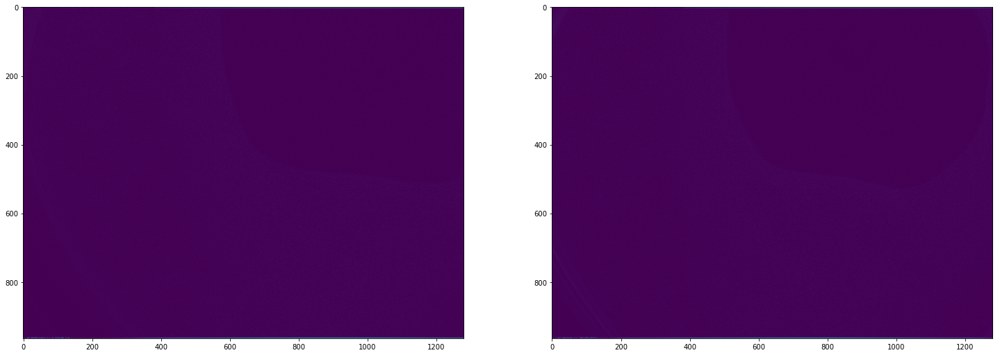

In [20]:
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(aapply_sobel_filter(blurry_DEMOSAIC))
axarr[1].imshow(aapply_sobel_filter(not_blurry_DEMOSAIC))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint15.tiff"))-float(laplacian("saint16.tiff")))))
print("   ################################################# DEMOSAIC_test_Image ########################################")
print("     "+str(float((laplacian("saint15.tiff")))) + "                                                  " + str(float(laplacian("saint16.tiff"))))


Laplacian Variance Difference = 105.852760036
   ################################################# DEMOSAIC_test_Image ########################################
     1611.45459766                                                  1717.3073577


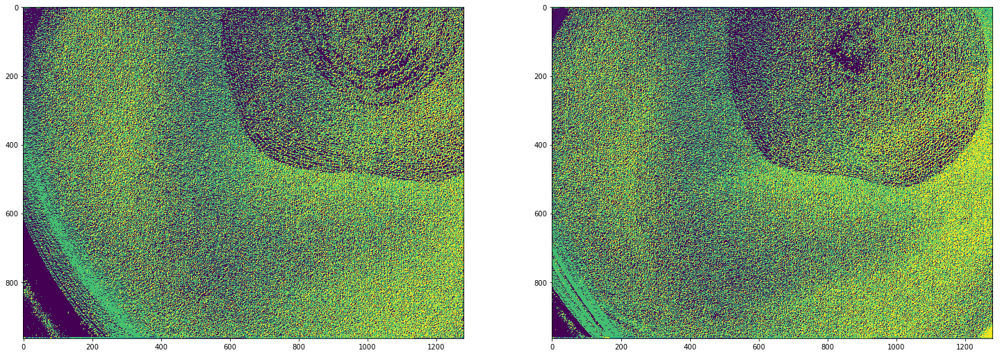

In [21]:
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(pply_sobel_filter(blurry_DEMOSAIC))
axarr[1].imshow(pply_sobel_filter(not_blurry_DEMOSAIC))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint13.tiff"))-float(laplacian("saint14.tiff")))))
print("   ################################################# DEMOSAIC_test_Image ########################################")
print("     "+str(float((laplacian("saint13.tiff")))) + "                                                  " + str(float(laplacian("saint14.tiff"))))


Laplacian Variance Difference = 108.184136705
   ################################################# DEMOSAIC_Sharp_Image ########################################
     18.2001471542                                                  126.384283859


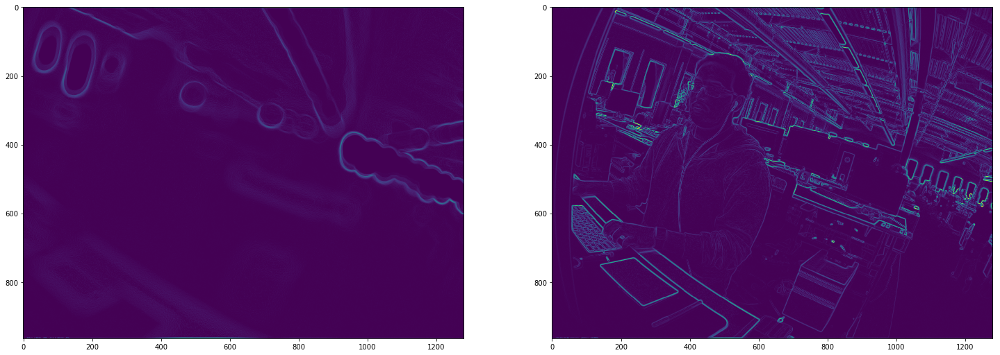

In [22]:
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(aapply_sobel_filter(blurry_me_DEMOSAIC))
axarr[1].imshow(aapply_sobel_filter(not_blurry_me_DEMOSAIC))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint19.tiff"))-float(laplacian("saint20.tiff")))))
print("   ################################################# DEMOSAIC_Sharp_Image ########################################")
print("     "+str(float((laplacian("saint19.tiff")))) + "                                                  " + str(float(laplacian("saint20.tiff"))))

Laplacian Variance Difference = 274.714591464
   ################################################# DEMOSAIC_Sharp_Image ########################################
     1418.91168479                                                  1693.62627626


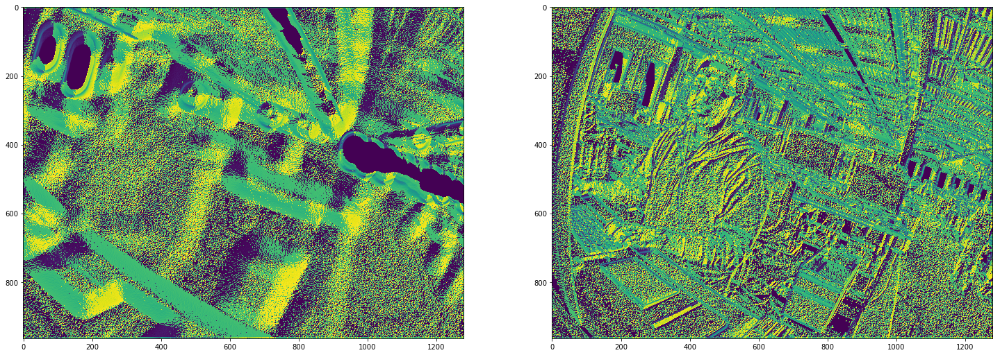

In [23]:
f, axarr = plt.subplots(1,2, figsize=(25,20))
axarr[0].imshow(pply_sobel_filter(blurry_me_DEMOSAIC))
axarr[1].imshow(pply_sobel_filter(not_blurry_me_DEMOSAIC))
print("Laplacian Variance Difference = " + str(abs(float(laplacian("saint17.tiff"))-float(laplacian("saint18.tiff")))))
print("   ################################################# DEMOSAIC_Sharp_Image ########################################")
print("     "+str(float((laplacian("saint17.tiff")))) + "                                                  " + str(float(laplacian("saint18.tiff"))))


In [24]:
hist1 = cv2.calcHist([apply_sobel_filter(blurry_RAW)],[0],None,[256],[0,256])
hist2 = cv2.calcHist([apply_sobel_filter(not_blurry_RAW)],[0],None,[256],[0,256])
hist3 = cv2.calcHist([apply_sobel_filter(blurry_DEMOSAIC)],[0],None,[256],[0,256])
hist4 = cv2.calcHist([apply_sobel_filter(not_blurry_DEMOSAIC)],[0],None,[256],[0,256])
hist5 = cv2.calcHist([apply_sobel_filter(blurry_me_RAW)],[0],None,[256],[0,256])
hist6 = cv2.calcHist([apply_sobel_filter(not_blurry_me_RAW)],[0],None,[256],[0,256])
hist7 = cv2.calcHist([apply_sobel_filter(blurry_me_DEMOSAIC)],[0],None,[256],[0,256])
hist8 = cv2.calcHist([apply_sobel_filter(not_blurry_me_DEMOSAIC)],[0],None,[256],[0,256])